In [1]:
import os
path = '/home/lishenghe/SINTER3D/' 
os.chdir(path)  
import torch
import pandas as pd
import scanpy as sc
from sklearn import metrics
import multiprocessing as mp
import numpy as np
import anndata as ad
import multiprocessing as mp
from matplotlib.image import imread 
from SINTER3D import utils
import warnings 
warnings.filterwarnings("ignore")  

os.environ["CUDA_VISIBLE_DEVICES"] = "1"


In [2]:
count = pd.read_csv("./data/human_heart/count matrices_and_meta/Filtered/ST_data/filtered_matrix.tsv",
                    sep="\t", index_col=0).T

meta = pd.read_csv("./data/human_heart/count matrices_and_meta/Filtered/ST_data/meta_data.tsv",
                   sep="\t", index_col=0)

genes_new = pd.read_csv("./data/human_heart/count matrices_and_meta/Filtered/ST_data/genes_new.txt",
                        sep='\t', header=0)

genes_new.columns = ['Gene_ID', 'Gene_Name']

# 创建基因ID到基因名的映射字典
gene_id_to_name = dict(zip(genes_new['Gene_ID'], genes_new['Gene_Name']))

# 检查匹配情况
print("Count matrix shape:", count.shape)
print("Genes_new shape:", genes_new.shape)
print("Count columns (first 5):", count.columns[:5].tolist())
print("Gene IDs (first 5):", genes_new['Gene_ID'][:5].tolist())

# 找到在genes_new中存在的count列
matched_columns = [col for col in count.columns if col in gene_id_to_name]
print(f"Matched columns: {len(matched_columns)} out of {len(count.columns)}")

# 只保留匹配的列
count_matched = count[matched_columns].copy()

# 将列名从基因ID替换为基因名
count_matched.columns = [gene_id_to_name[col] for col in count_matched.columns]

# 移除可能的空基因名列
count_final = count_matched.loc[:, count_matched.columns.notna()]

print("Final count matrix shape:", count_final.shape)
print("Sample gene names:", count_final.columns[:5].tolist())

# 将处理后的矩阵赋值回count变量
count = count_final


Count matrix shape: (3111, 39739)
Genes_new shape: (39740, 2)
Count columns (first 5): ['ENSG00000000003.14', 'ENSG00000000005.5', 'ENSG00000000419.12', 'ENSG00000000457.13', 'ENSG00000000460.16']
Gene IDs (first 5): ['ENSG00000000003.14', 'ENSG00000000005.5', 'ENSG00000000419.12', 'ENSG00000000457.13', 'ENSG00000000460.16']
Matched columns: 39739 out of 39739
Final count matrix shape: (3111, 39739)
Sample gene names: ['TSPAN6', 'TNMD', 'DPM1', 'SCYL3', 'FIRRM']


In [ ]:
count_ref = pd.read_csv("../data/human_heart/count matrices_and_meta/Filtered/scRNA-seq_data/all_cells_count_matrix_filtered.tsv",
                        sep='\t', index_col=0).T

meta_ref = pd.read_csv("../data/human_heart/count matrices_and_meta/Filtered/scRNA-seq_data/all_cells_meta_data_filtered.tsv",
                        sep='\t', index_col=0)

adata_ref = ad.AnnData(X = count_ref.values)
adata_ref.obs.index = count_ref.index
adata_ref.var.index = count_ref.columns
for col in meta_ref.columns[:-1]:
    adata_ref.obs[col] = meta_ref.loc[count_ref.index][col].values

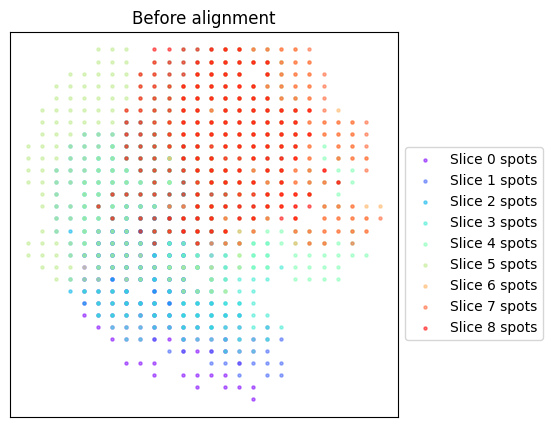

Using the Iterative Closest Point algorithm for alignemnt.
Detecting edges...
Aligning edges...


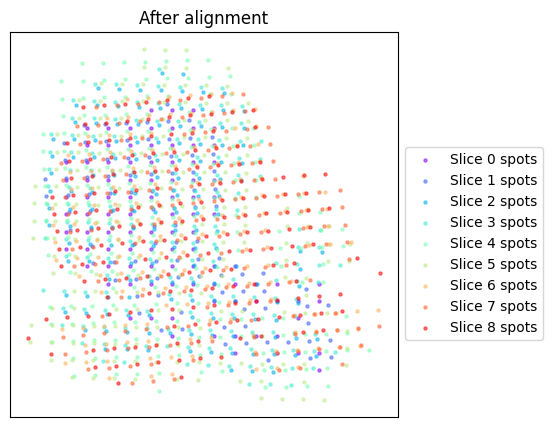

In [3]:
adata_st_list_raw = []

for i in range(1, 10):
    count_i = count[[loc.split("x")[0]==str(i+4) for loc in count.index]]
    count_i.index = [(loc.split("x")[1]+"x"+loc.split("x")[2]) for loc in count_i.index]
    meta_i = meta[[loc.split("x")[0]==str(i+4) for loc in meta.index]]
    meta_i.index = [(loc.split("x")[1]+"x"+loc.split("x")[2]) for loc in meta_i.index]

    loc_i = pd.read_csv("./data/human_heart/ST_Samples_6.5PCW/ST_Sample_6.5PCW_%d/spot_data-all-ST_Sample_6.5PCW_%d.tsv" % (i, i),
                       sep="\t")

    loc_i.index = [(str(loc_i.x.values[k]) + 'x' + str(loc_i.y.values[k])) for k in range(loc_i.shape[0])]
    loc_i = loc_i.loc[meta_i.index]

    img_i = imread('./data/human_heart/ST_Samples_6.5PCW/ST_Sample_6.5PCW_%d/ST_Sample_6.5PCW_%d_HE_small.jpg' % (i, i))


    adata_st_i = ad.AnnData(X = count_i.values)

    adata_st_i.obs = meta_i
    adata_st_i.obs['selected'] = loc_i['selected'].values
    adata_st_i.var.index = count_i.columns

    library_id = '0'
    adata_st_i.uns["spatial"] = dict()
    adata_st_i.uns["spatial"]['0'] = dict()
    adata_st_i.uns["spatial"]['0']['images'] = dict()
    adata_st_i.uns["spatial"]['0']['images']['hires'] = img_i
    adata_st_i.uns["spatial"]['0']['scalefactors'] = {'spot_diameter_fullres': 100,
                                                      'tissue_hires_scalef': 1.0,
                                                      'fiducial_diameter_fullres': 100,
                                                      'tissue_lowres_scalef': 1.0}

    adata_st_i.obsm['spatial'] = np.concatenate((loc_i['pixel_x'].values.reshape(-1, 1),
                                                 loc_i['pixel_y'].values.reshape(-1, 1)), axis=1)

    adata_st_i.obsm['loc_use'] = np.concatenate((loc_i['x'].values.reshape(-1, 1),
                                                 loc_i['y'].values.reshape(-1, 1)), axis=1)

    adata_st_i.obs['array_row'] = loc_i['y'].values
    adata_st_i.obs['array_col'] = loc_i['x'].values

    adata_st_i = adata_st_i[adata_st_i.obs['selected'].values != 0]
    adata_st_list_raw.append(adata_st_i.copy())

adata_st_list = utils.align_spots(adata_st_list_raw, data_type = "ST", coor_key="loc_use", test_all_angles=True, plot=True)


slice_idx = [adata.obs['Sample'].values[0] for adata in adata_st_list]

In [ ]:
adata_st, adata_basis = utils.preprocess(adata_st_list,
                                                  adata_ref,
                                                  sample_col="experiment",
                                                  c2c_dist=200., coor_key="loc_use",
                                                  slice_dist_micron=[5., 115., 85., 160.,
                                                                     5., 160., 5., 155.,],
                                                  n_hvg_group=500)


In [4]:

from SINTER3D.predict_selector import auto_select_and_train 
model = auto_select_and_train(
    adata_st_list,
    adata_st,
    adata_basis,
    slice_idx=slice_idx,
    selector_path='/home/lishenghe/SINTER3D/model_selector.pkl',
    config='/home/lishenghe/SINTER3D/SINTER3D/config/human_heart.json',
)


[特征] n_slices=9, expr_complexity=0.313184
🎯 数据驱动选择模型: COMPLEX
📄 Config parameters loaded: {'hidden_dims': [512, 128], 'slice_emb_dim': 16, 'coef_fe': 0.1, 'training_steps': 10000, 'lr': 0.001, 'seed': 2025, 'patience': 200, 'lambda_dice': 0.5, 'alpha_reg': 0.7, 'mid_channel': 200, 'save_path': './results_hb', 'use_type': 'train', 'normalize': 100, 'beta_coord': 0.2}

✅ Final parameters used in Model:
  hidden_dims: [512, 128]
  slice_emb_dim: 16
  coef_fe: 0.1
  training_steps: 10000
  lr: 0.001
  seed: 2025
  patience: 200
  lambda_dice: 0.5
  alpha_reg: 0.7
  mid_channel: 200
  save_path: ./results_hb
  use_type: train
  normalize: 100
  beta_coord: 0.2

随机种子已设置为: 2025


  0%|          | 5/10000 [00:00<07:19, 22.74it/s]

[Step 0] Loss=7647.591309 | CoordLoss=1.782698 | Best=inf


 10%|█         | 1007/10000 [00:29<04:31, 33.14it/s]

[Step 1000] Loss=1516.507080 | CoordLoss=9.924479 | Best=1482.352539


 20%|██        | 2007/10000 [00:59<03:43, 35.77it/s]

[Step 2000] Loss=859.151001 | CoordLoss=9.658092 | Best=859.215027


 30%|███       | 3003/10000 [01:29<05:14, 22.21it/s]

[Step 3000] Loss=696.119141 | CoordLoss=9.562516 | Best=663.554260


 37%|███▋      | 3671/10000 [01:57<03:23, 31.18it/s]

⏹ Early stopping triggered at step 3671 | Best Loss=583.630066
✅ Loaded best model state from training.


In [ ]:
save_path = "/home/lishenghe/SINTER3D/result_human_heart_domain=4/"
result = model.eval(adata_st_list, save=False, output_path=save_path)

### 差异基因分析

In [16]:
import scanpy as sc
import pandas as pd
import numpy as np

def find_markers_for_selected_slices(result, selected_slice_ids, min_spots=5, save_dir=None):
    """
    对筛选后的切片进行差异基因分析
    
    参数:
    - result: 所有切片的列表
    - selected_slice_ids: 你手动筛选的切片ID列表，例如 [0, 2, 5]
    - min_spots: domain最少spots数阈值
    - save_dir: 结果保存路径
    """
    all_markers = {}  # 保存所有切片的marker基因
    
    for slice_id in selected_slice_ids:
        adata = result[slice_id].copy()
        
        print(f"\n{'='*70}")
        print(f"🔬 正在分析 Slice {slice_id}")
        print(f"{'='*70}")
        print(f"Spots数: {adata.n_obs}, 基因数: {adata.n_vars}")
        
        # 查看domain分布
        domain_counts = adata.obs['domain'].value_counts().sort_index()
        print(f"\nDomain分布:")
        for domain, count in domain_counts.items():
            status = "✓" if count >= min_spots else "✗"
            print(f"  Domain {domain}: {count} spots {status}")
        
        # 过滤小domain
        valid_domains = domain_counts[domain_counts >= min_spots].index.tolist()
        
        if len(valid_domains) < 2:
            print(f"⚠️  警告: 有效domain数<2，跳过此切片")
            continue
        
        # 只保留有效domain的数据
        adata_filtered = adata[adata.obs['domain'].isin(valid_domains)].copy()
        print(f"\n保留 {len(valid_domains)} 个有效domains进行分析")
        
        # 数据预处理（如果还没做）
        if 'log1p' not in adata_filtered.uns:
            print("正在进行数据标准化...")
            sc.pp.normalize_total(adata_filtered, target_sum=1e4)
            sc.pp.log1p(adata_filtered)
        
        # 差异基因分析
        print("\n🔍 正在进行差异分析 (Wilcoxon秩和检验)...")
        sc.tl.rank_genes_groups(
            adata_filtered,
            groupby='domain',
            method='wilcoxon',
            key_added='domain_markers',
            use_raw=False,
            pts=True  # 计算每个组中表达该基因的细胞比例
        )
        
        # 提取每个domain的marker基因
        markers_dict = {}
        
        for domain in valid_domains:
            markers_df = sc.get.rank_genes_groups_df(
                adata_filtered,
                group=str(domain),
                key='domain_markers'
            )
            
            # 筛选标准:
            # 1. 校正后p值 < 0.05
            # 2. log2FC > 0.5 (表达量提高至少1.4倍)
            # 3. 在该domain中至少25%的spots表达
            sig_markers = markers_df[
                (markers_df['pvals_adj'] < 0.05) & 
                (markers_df['logfoldchanges'] > 0.5)
            ].copy()
            
            # 按logFC排序
            sig_markers = sig_markers.sort_values('logfoldchanges', ascending=False)
            
            markers_dict[domain] = sig_markers
            
            print(f"\n  Domain {domain}:")
            print(f"    显著上调基因: {len(sig_markers)}")
            
            if len(sig_markers) > 0:
                top5 = sig_markers.head(5)
                print(f"    Top 5基因:")
                for idx, row in top5.iterrows():
                    print(f"      {row['names']}: logFC={row['logfoldchanges']:.2f}, p={row['pvals_adj']:.2e}")
        
        # 保存此切片的结果
        all_markers[slice_id] = {
            'adata': adata_filtered,
            'markers': markers_dict,
            'valid_domains': valid_domains
        }
        
        # 保存到文件
        if save_dir:
            import os
            os.makedirs(save_dir, exist_ok=True)
            
            # 保存所有domain的marker基因到一个Excel文件
            with pd.ExcelWriter(f"{save_dir}/slice_{slice_id}_markers.xlsx") as writer:
                for domain, markers in markers_dict.items():
                    markers.to_excel(writer, sheet_name=f'Domain_{domain}', index=False)
            
            print(f"\n✓ Marker基因已保存到: {save_dir}/slice_{slice_id}_markers.xlsx")
    
    return all_markers


# ========== 使用示例 ==========

# 1. 定义你筛选的切片ID
selected_slices = [2,3,4,5,6,7]  

# 2. 运行分析
save_path = "/home/lishenghe/SINTER3D/result_human_heart_domain=4/marker_genes/"

markers_results = find_markers_for_selected_slices(
    result=result,
    selected_slice_ids=selected_slices,
    min_spots=5,
    save_dir=save_path
)

# 3. 查看整体结果
print(f"\n{'='*70}")
print("📊 分析汇总")
print(f"{'='*70}")

for slice_id, data in markers_results.items():
    n_domains = len(data['valid_domains'])
    total_markers = sum(len(m) for m in data['markers'].values())
    print(f"\nSlice {slice_id}:")
    print(f"  有效domains: {n_domains}")
    print(f"  总marker基因数: {total_markers}")
    
    for domain in data['valid_domains']:
        n_genes = len(data['markers'][domain])
        print(f"    Domain {domain}: {n_genes} genes")



🔬 正在分析 Slice 2
Spots数: 155, 基因数: 39739

Domain分布:
  Domain 1: 33 spots ✓
  Domain 2: 86 spots ✓
  Domain 3: 9 spots ✓
  Domain 4: 27 spots ✓

保留 4 个有效domains进行分析
正在进行数据标准化...

🔍 正在进行差异分析 (Wilcoxon秩和检验)...

  Domain 1:
    显著上调基因: 4
    Top 5基因:
      MYH6: logFC=2.98, p=2.17e-03
      COL2A1: logFC=2.66, p=2.69e-03
      NR2F2: logFC=2.31, p=3.27e-02
      PAM: logFC=2.18, p=1.45e-02

  Domain 2:
    显著上调基因: 184
    Top 5基因:
      FGF18: logFC=3.37, p=2.11e-02
      MITF: logFC=3.08, p=2.26e-04
      SLC5A1: logFC=3.03, p=8.79e-03
      SORBS2: logFC=2.87, p=3.39e-16
      MYL2: logFC=2.75, p=1.20e-16

  Domain 3:
    显著上调基因: 173
    Top 5基因:
      UCA1: logFC=5.32, p=7.77e-03
      EPB42: logFC=5.27, p=5.51e-03
      DMTN: logFC=5.23, p=5.68e-03
      HEMGN: logFC=5.21, p=1.76e-03
      MPP1: logFC=5.19, p=1.76e-03

  Domain 4:
    显著上调基因: 268
    Top 5基因:
      HOXA3: logFC=6.30, p=4.96e-03
      PRDM6: logFC=6.28, p=4.44e-04
      IL34: logFC=5.91, p=1.55e-02
      SULT1E1: logFC=5

In [17]:
#GO
import gseapy as gp
from gseapy import Msigdb
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
def perform_go_enrichment_single_domain(gene_list, organism='human', max_genes=500):
    """
    对单个domain的基因列表进行GO富集分析
    
    参数:
    - gene_list: 基因列表
    - organism: 'human' 或 'mouse'
    - max_genes: 最多使用前N个基因（避免基因太多导致不够特异）
    
    返回:
    - 富集结果DataFrame
    """
    if len(gene_list) == 0:
        print("    ⚠️ 基因列表为空，跳过")
        return None
    
    # 如果基因太多，只取logFC最高的top基因
    if len(gene_list) > max_genes:
        gene_list = gene_list[:max_genes]
        print(f"    使用top {max_genes}个基因进行富集")
    
    print(f"    正在富集 {len(gene_list)} 个基因...")
    
    try:
        # GO Biological Process
        enr = gp.enrichr(
            gene_list=gene_list,
            gene_sets='GO_Biological_Process_2023',
            organism='Human' if organism == 'human' else 'Mouse',
            outdir=None,
            cutoff=0.05
        )
        
        results = enr.results
        
        if len(results) > 0:
            print(f"    ✓ 找到 {len(results)} 个显著富集的GO terms (p<0.05)")
            return results
        else:
            print(f"    ⚠️ 未找到显著富集的GO terms")
            return None
            
    except Exception as e:
        print(f"    ✗ 富集分析失败: {e}")
        return None


def enrich_all_domains_single_slice(markers_dict, slice_id, organism='human'):
    """
    对一个切片的所有domain进行GO富集
    
    参数:
    - markers_dict: 该切片的marker基因字典 {domain: DataFrame}
    - slice_id: 切片ID
    - organism: 物种
    
    返回:
    - enrichment_results: {domain: GO富集结果DataFrame}
    """
    print(f"\n{'='*70}")
    print(f"🔬 Slice {slice_id} - GO富集分析")
    print(f"{'='*70}")
    
    enrichment_results = {}
    
    for domain, markers_df in markers_dict.items():
        print(f"\n  Domain {domain} ({len(markers_df)} marker genes):")
        
        if len(markers_df) < 3:
            print(f"    ⚠️ 基因数<5，跳过富集分析")
            continue
        
        # 提取基因列表（已按logFC排序）
        gene_list = markers_df['names'].tolist()
        
        # 执行富集
        enr_result = perform_go_enrichment_single_domain(
            gene_list, 
            organism=organism,
            max_genes=300  # 最多用前300个基因
        )
        
        if enr_result is not None and len(enr_result) > 0:
            enrichment_results[domain] = enr_result
    
    return enrichment_results

# 使用之前保存的markers_results
all_go_results = {}

for slice_id, data in markers_results.items():
    # 执行GO富集
    go_results = enrich_all_domains_single_slice(
        markers_dict=data['markers'],
        slice_id=slice_id,
        organism='human'
    )
    
    all_go_results[slice_id] = go_results
    
    print(f"\n  Slice {slice_id} 完成: {len(go_results)} 个domain有富集结果")

print(f"\n{'='*70}")
print("✓ 所有切片GO富集分析完成！")
print(f"{'='*70}")





🔬 Slice 2 - GO富集分析

  Domain 1 (4 marker genes):
    正在富集 4 个基因...
    ✓ 找到 72 个显著富集的GO terms (p<0.05)

  Domain 2 (184 marker genes):
    正在富集 184 个基因...
    ✓ 找到 1212 个显著富集的GO terms (p<0.05)

  Domain 3 (173 marker genes):
    正在富集 173 个基因...
    ✓ 找到 1270 个显著富集的GO terms (p<0.05)

  Domain 4 (268 marker genes):
    正在富集 268 个基因...
    ✓ 找到 1637 个显著富集的GO terms (p<0.05)

  Slice 2 完成: 4 个domain有富集结果

🔬 Slice 3 - GO富集分析

  Domain 1 (15 marker genes):
    正在富集 15 个基因...
    ✓ 找到 271 个显著富集的GO terms (p<0.05)

  Domain 2 (268 marker genes):
    正在富集 268 个基因...
    ✓ 找到 1556 个显著富集的GO terms (p<0.05)

  Domain 3 (296 marker genes):
    正在富集 296 个基因...
    ✓ 找到 1687 个显著富集的GO terms (p<0.05)

  Domain 4 (377 marker genes):
    使用top 300个基因进行富集
    正在富集 300 个基因...
    ✓ 找到 1698 个显著富集的GO terms (p<0.05)

  Slice 3 完成: 4 个domain有富集结果

🔬 Slice 4 - GO富集分析

  Domain 1 (10 marker genes):
    正在富集 10 个基因...
    ✓ 找到 109 个显著富集的GO terms (p<0.05)

  Domain 2 (130 marker genes):
    正在富集 130 个基因...
    ✓ 找到 

In [18]:
#GO保存
def save_go_results_to_excel(all_go_results, markers_results, save_dir):
    """
    将所有GO富集结果保存为Excel文件
    """
    os.makedirs(save_dir, exist_ok=True)
    
    for slice_id, go_results in all_go_results.items():
        if len(go_results) == 0:
            continue
        
        excel_path = f"{save_dir}/slice_{slice_id}_GO_enrichment.xlsx"
        
        with pd.ExcelWriter(excel_path, engine='openpyxl') as writer:
            for domain, enr_df in go_results.items():
                # 只保留最相关的列
                columns_to_save = [
                    'Term', 'Overlap', 'P-value', 'Adjusted P-value',
                    'Odds Ratio', 'Combined Score', 'Genes'
                ]
                save_df = enr_df[columns_to_save].copy()
                
                # 按Adjusted P-value排序
                save_df = save_df.sort_values('Adjusted P-value')
                
                # 保存到sheet
                save_df.to_excel(writer, sheet_name=f'Domain_{domain}', index=False)
        
        print(f"✓ 保存: {excel_path}")
    
    print(f"\n✓ 所有GO富集结果已保存到: {save_dir}")


# 执行保存
save_dir = "/home/lishenghe/SINTER3D/result_human_heart_domain=4/GO_enrichment/"
save_go_results_to_excel(all_go_results, markers_results, save_dir)



✓ 保存: /home/lishenghe/SINTER3D/result_human_heart_domain=4/GO_enrichment//slice_2_GO_enrichment.xlsx
✓ 保存: /home/lishenghe/SINTER3D/result_human_heart_domain=4/GO_enrichment//slice_3_GO_enrichment.xlsx
✓ 保存: /home/lishenghe/SINTER3D/result_human_heart_domain=4/GO_enrichment//slice_4_GO_enrichment.xlsx
✓ 保存: /home/lishenghe/SINTER3D/result_human_heart_domain=4/GO_enrichment//slice_5_GO_enrichment.xlsx
✓ 保存: /home/lishenghe/SINTER3D/result_human_heart_domain=4/GO_enrichment//slice_6_GO_enrichment.xlsx
✓ 保存: /home/lishenghe/SINTER3D/result_human_heart_domain=4/GO_enrichment//slice_7_GO_enrichment.xlsx

✓ 所有GO富集结果已保存到: /home/lishenghe/SINTER3D/result_human_heart_domain=4/GO_enrichment/


In [19]:
#GO可视化
def plot_go_barplot_per_domain(enr_df, domain, slice_id, top_n=10, save_path=None):
    """
    为单个domain绘制GO富集柱状图
    """
    if enr_df is None or len(enr_df) == 0:
        return
    
    # 选择top N个term
    plot_df = enr_df.head(top_n).copy()
    
    # 计算-log10(adj p-value)
    plot_df['neg_log_p'] = -np.log10(plot_df['Adjusted P-value'])
    
    # 截断过长的term名称
    plot_df['Term_short'] = plot_df['Term'].apply(
        lambda x: x[:60] + '...' if len(x) > 60 else x
    )
    
    # 从Overlap列提取基因数 (格式: "5/100")
    plot_df['gene_count'] = plot_df['Overlap'].apply(
        lambda x: int(x.split('/')[0])
    )
    
    # 排序
    plot_df = plot_df.sort_values('neg_log_p')
    
    # 绘图
    fig, ax = plt.subplots(figsize=(10, max(6, top_n * 0.4)))
    
    # 颜色映射
    colors = plt.cm.Reds(plot_df['neg_log_p'] / plot_df['neg_log_p'].max())
    
    bars = ax.barh(range(len(plot_df)), plot_df['neg_log_p'], color=colors)
    
    ax.set_yticks(range(len(plot_df)))
    ax.set_yticklabels(plot_df['Term_short'], fontsize=9)
    ax.set_xlabel('-log10(Adjusted P-value)', fontsize=11, fontweight='bold')
    ax.set_title(f'Slice {slice_id} - Domain {domain}\nTop {top_n} GO Terms', 
                 fontsize=13, fontweight='bold')
    
    # 添加基因数标签
    for i, (idx, row) in enumerate(plot_df.iterrows()):
        ax.text(row['neg_log_p'] + 0.5, i, f"n={row['gene_count']}", 
                va='center', fontsize=8, color='darkred')
    
    ax.grid(axis='x', alpha=0.3)
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        plt.close()
    else:
        plt.show()


def visualize_all_go_results(all_go_results, save_dir, top_n=10):
    """
    为所有切片的所有domain生成GO富集柱状图
    """
    plot_dir = f"{save_dir}/barplots/"
    os.makedirs(plot_dir, exist_ok=True)
    
    total_plots = 0
    
    for slice_id, go_results in all_go_results.items():
        print(f"\n绘制 Slice {slice_id} 的GO富集图...")
        
        for domain, enr_df in go_results.items():
            save_path = f"{plot_dir}/slice_{slice_id}_domain_{domain}_GO_barplot.png"
            
            plot_go_barplot_per_domain(
                enr_df, domain, slice_id, 
                top_n=top_n, 
                save_path=save_path
            )
            
            total_plots += 1
            print(f"  ✓ Domain {domain}")
    
    print(f"\n✓ 共生成 {total_plots} 张GO富集柱状图")
    print(f"✓ 保存位置: {plot_dir}")


# 执行可视化
visualize_all_go_results(
    all_go_results, 
    save_dir=save_dir,
    top_n=15  # 每个domain显示top 15 GO terms
)



绘制 Slice 2 的GO富集图...
  ✓ Domain 1
  ✓ Domain 2
  ✓ Domain 3
  ✓ Domain 4

绘制 Slice 3 的GO富集图...
  ✓ Domain 1
  ✓ Domain 2
  ✓ Domain 3
  ✓ Domain 4

绘制 Slice 4 的GO富集图...
  ✓ Domain 1
  ✓ Domain 2
  ✓ Domain 3
  ✓ Domain 4

绘制 Slice 5 的GO富集图...
  ✓ Domain 1
  ✓ Domain 2
  ✓ Domain 3
  ✓ Domain 4

绘制 Slice 6 的GO富集图...
  ✓ Domain 1
  ✓ Domain 2
  ✓ Domain 3
  ✓ Domain 4

绘制 Slice 7 的GO富集图...
  ✓ Domain 1
  ✓ Domain 2
  ✓ Domain 3

✓ 共生成 23 张GO富集柱状图
✓ 保存位置: /home/lishenghe/SINTER3D/result_human_heart_domain=4/GO_enrichment//barplots/


In [20]:
#单切片GO可视化
def plot_go_dotplot_slice(go_results, slice_id, top_n=5, save_path=None):
    """
    为单个切片的所有domain绘制GO富集点图
    """
    plot_data = []
    
    for domain, enr_df in go_results.items():
        if enr_df is None or len(enr_df) == 0:
            continue
        
        # 取top N个terms
        top_terms = enr_df.head(top_n)
        
        for _, row in top_terms.iterrows():
            # 提取基因数
            gene_count = int(row['Overlap'].split('/')[0])
            
            plot_data.append({
                'Domain': f"D{domain}",
                'Term': row['Term'][:50],  # 截断过长名称
                'Adj_Pvalue': row['Adjusted P-value'],
                'Gene_Count': gene_count,
                'neg_log_p': -np.log10(row['Adjusted P-value'])
            })
    
    if len(plot_data) == 0:
        print(f"  ⚠️ Slice {slice_id} 没有数据可绘制")
        return
    
    plot_df = pd.DataFrame(plot_data)
    
    # 绘图
    fig, ax = plt.subplots(figsize=(12, max(8, len(plot_df) * 0.15)))
    
    # 创建散点图
    scatter = ax.scatter(
        plot_df['Domain'],
        plot_df['Term'],
        s=plot_df['Gene_Count'] * 30,
        c=plot_df['neg_log_p'],
        cmap='Reds',
        alpha=0.7,
        edgecolors='black',
        linewidth=0.5
    )
    
    ax.set_xlabel('Domain', fontsize=12, fontweight='bold')
    ax.set_ylabel('GO Term', fontsize=12, fontweight='bold')
    ax.set_title(f'Slice {slice_id} - GO Enrichment Across Domains\n(Top {top_n} per domain)', 
                 fontsize=14, fontweight='bold')
    
    # 旋转x轴标签
    plt.xticks(rotation=0, ha='center')
    
    # 添加颜色条
    cbar = plt.colorbar(scatter, ax=ax)
    cbar.set_label('-log10(Adj P-value)', rotation=270, labelpad=20, fontweight='bold')
    
    # 添加图例（点大小）
    sizes = [5, 10, 20]
    labels = ['5', '10', '20']
    legend_points = [
        plt.scatter([], [], s=s*30, c='gray', alpha=0.7, edgecolors='black') 
        for s in sizes
    ]
    ax.legend(legend_points, labels, title='Gene Count', 
              loc='upper left', bbox_to_anchor=(1.15, 1), frameon=True)
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        plt.close()
    else:
        plt.show()


def create_all_dotplots(all_go_results, save_dir, top_n=5):
    """
    为所有切片创建点图
    """
    dotplot_dir = f"{save_dir}/dotplots/"
    os.makedirs(dotplot_dir, exist_ok=True)
    
    for slice_id, go_results in all_go_results.items():
        print(f"绘制 Slice {slice_id} 的点图...")
        
        save_path = f"{dotplot_dir}/slice_{slice_id}_GO_dotplot.png"
        plot_go_dotplot_slice(go_results, slice_id, top_n=top_n, save_path=save_path)
    
    print(f"\n✓ 所有点图已保存到: {dotplot_dir}")


# 执行点图绘制
create_all_dotplots(all_go_results, save_dir='/home/lishenghe/SINTER3D/result_human_heart_domain=4/', top_n=5)


绘制 Slice 2 的点图...
绘制 Slice 3 的点图...
绘制 Slice 4 的点图...
绘制 Slice 5 的点图...
绘制 Slice 6 的点图...
绘制 Slice 7 的点图...

✓ 所有点图已保存到: /home/lishenghe/SINTER3D/result_human_heart_domain=4//dotplots/


### 空间域与细胞类型热图

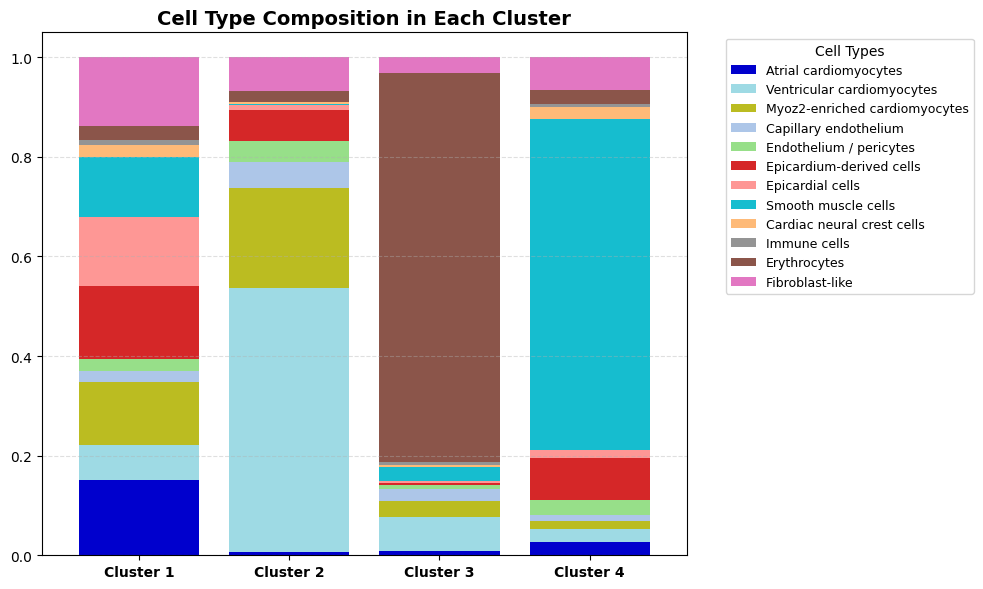

In [21]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# 你的AnnData对象
adata = result[0]

# 提取细胞类型列名（确保名称与adata.obs列一致）
cell_types = [
    'Atrial cardiomyocytes',
    'Ventricular cardiomyocytes',
    'Myoz2-enriched cardiomyocytes',
    'Capillary endothelium',
    'Endothelium / pericytes ',
    'Epicardium-derived cells',
    'Epicardial cells',
    'Smooth muscle cells ',
    'Cardiac neural crest cells ',
    'Immune cells',
    'Erythrocytes',
    'Fibroblast-like '
]

# 从obs中取出domain和细胞类型数据
domain_data = adata.obs['domain']
cell_type_data = adata.obs[cell_types].values

# 计算每个domain中各细胞类型的平均比例
cell_type_proportions = []
for domain in sorted(domain_data.unique()):
    mask = (domain_data == domain)
    proportions = cell_type_data[mask].mean(axis=0)
    cell_type_proportions.append(proportions)

# 转换为DataFrame
df_proportions = pd.DataFrame(cell_type_proportions, columns=cell_types, index=sorted(domain_data.unique()))

# === 使用自定义配色 ===
custom_colors = [
    "#0000CD",  # 蓝 - Atrial cardiomyocytes
    "#9EDAE4",  # 浅蓝 - Ventricular cardiomyocytes
    "#BBBC21",  # 橄榄绿 - Myoz2-enriched cardiomyocytes
    "#ADC6E8",  # 天蓝 - Capillary endothelium
    "#97DF89",  # 灰绿 - Endothelium/pericytes
    "#D52728",  # 红 - Epicardium-derived cells
    "#FE9795",  # 粉 - Epicardial cells
    "#16BDCF",  # 亮蓝 - Smooth muscle cells
    "#FEBA78",  # 橙 - Cardiac neural crest cells
    "#949494",  # 棕 - Immune cells
    "#8B554A",  # 深棕 - Erythrocytes
    "#E277C2",  # 粉紫 - Fibroblast-like
]

# === 绘制堆叠柱状图 ===
fig, ax = plt.subplots(figsize=(10, 6))

df_proportions.plot(
    kind='bar', 
    stacked=True, 
    color=custom_colors, 
    ax=ax,
    width=0.8
)

# 样式调整
ax.set_title('Cell Type Composition in Each Cluster', fontsize=14, fontweight='bold')

# 修改x轴标签
ax.set_xticklabels([f"Cluster {i+1}" for i in range(len(df_proportions))], fontsize=10,fontweight='bold',)

ax.legend(
    title='Cell Types',
    bbox_to_anchor=(1.05, 1),
    loc='upper left',
    fontsize=9
)

ax.tick_params(axis='x', rotation=0)
ax.grid(axis='y', linestyle='--', alpha=0.4)

plt.tight_layout()
plt.show()


In [22]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import os

# 创建保存图片的文件夹
output_dir = 'cell_composition_plots'
os.makedirs(output_dir, exist_ok=True)

# 细胞类型列名
cell_types = [
    'Atrial cardiomyocytes',
    'Ventricular cardiomyocytes',
    'Myoz2-enriched cardiomyocytes',
    'Capillary endothelium',
    'Endothelium / pericytes ',
    'Epicardium-derived cells',
    'Epicardial cells',
    'Smooth muscle cells ',
    'Cardiac neural crest cells ',
    'Immune cells',
    'Erythrocytes',
    'Fibroblast-like '
]

# 自定义配色
custom_colors = [
    "#0000CD",  # 蓝 - Atrial cardiomyocytes
    "#9EDAE4",  # 浅蓝 - Ventricular cardiomyocytes
    "#BBBC21",  # 橄榄绿 - Myoz2-enriched cardiomyocytes
    "#ADC6E8",  # 天蓝 - Capillary endothelium
    "#97DF89",  # 灰绿 - Endothelium/pericytes
    "#D52728",  # 红 - Epicardium-derived cells
    "#FE9795",  # 粉 - Epicardial cells
    "#16BDCF",  # 亮蓝 - Smooth muscle cells
    "#FEBA78",  # 橙 - Cardiac neural crest cells
    "#949494",  # 灰 - Immune cells
    "#8B554A",  # 深棕 - Erythrocytes
    "#E277C2",  # 粉紫 - Fibroblast-like
]

# 遍历result列表中的所有切片
for slice_idx, adata in enumerate(result):
    print(f"Processing slice {slice_idx + 1}/{len(result)}...")
    
    try:
        # 从obs中取出domain和细胞类型数据
        domain_data = adata.obs['domain']
        cell_type_data = adata.obs[cell_types].values
        
        # 计算每个domain中各细胞类型的平均比例
        cell_type_proportions = []
        for domain in sorted(domain_data.unique()):
            mask = (domain_data == domain)
            proportions = cell_type_data[mask].mean(axis=0)
            cell_type_proportions.append(proportions)
        
        # 转换为DataFrame
        df_proportions = pd.DataFrame(
            cell_type_proportions, 
            columns=cell_types, 
            index=sorted(domain_data.unique())
        )
        
        # 绘制堆叠柱状图
        fig, ax = plt.subplots(figsize=(10, 6))
        
        df_proportions.plot(
            kind='bar', 
            stacked=True, 
            color=custom_colors, 
            ax=ax,
            width=0.8
        )
        
        # 样式调整
        ax.set_title(
            f'Cell Type Composition in Each Cluster (Slice {slice_idx + 1})', 
            fontsize=14, 
            fontweight='bold'
        )
        
        # 修改x轴标签
        ax.set_xticklabels(
            [f"Cluster {i+1}" for i in range(len(df_proportions))], 
            fontsize=10,
            fontweight='bold'
        )
        
        ax.legend(
            title='Cell Types',
            bbox_to_anchor=(1.05, 1),
            loc='upper left',
            fontsize=9
        )
        
        ax.tick_params(axis='x', rotation=0)
        ax.grid(axis='y', linestyle='--', alpha=0.4)
        
        plt.tight_layout()
        
        # 保存图片
        output_path = os.path.join(output_dir, f'slice_{slice_idx + 1}_cell_composition.png')
        plt.savefig(output_path, dpi=300, bbox_inches='tight')
        print(f"Saved: {output_path}")
        
        # 关闭图形以释放内存
        plt.close(fig)
        
    except Exception as e:
        print(f"Error processing slice {slice_idx + 1}: {str(e)}")
        continue

print(f"\n所有图片已保存到文件夹: {output_dir}")


Processing slice 1/9...
Saved: cell_composition_plots/slice_1_cell_composition.png
Processing slice 2/9...
Saved: cell_composition_plots/slice_2_cell_composition.png
Processing slice 3/9...
Saved: cell_composition_plots/slice_3_cell_composition.png
Processing slice 4/9...
Saved: cell_composition_plots/slice_4_cell_composition.png
Processing slice 5/9...
Saved: cell_composition_plots/slice_5_cell_composition.png
Processing slice 6/9...
Saved: cell_composition_plots/slice_6_cell_composition.png
Processing slice 7/9...
Saved: cell_composition_plots/slice_7_cell_composition.png
Processing slice 8/9...
Saved: cell_composition_plots/slice_8_cell_composition.png
Processing slice 9/9...
Saved: cell_composition_plots/slice_9_cell_composition.png

所有图片已保存到文件夹: cell_composition_plots


In [23]:
# 保存聚类
import pandas as pd

domain_series = adata_st.obs["domain"]
domain_df = domain_series.to_frame()

domain_df.to_csv("/home/lishenghe/SINTER3D/result_human_heart_domain=4/cluster_3D.csv")


In [24]:
# 保存聚类
import pandas as pd

domain_series = adata_st.obs["res.0.8"]
domain_df = domain_series.to_frame()

domain_df.to_csv("/home/lishenghe/SINTER3D/result_human_heart_domain=4/cluster_truth.csv")


In [25]:
# 保存坐标
import pandas as pd

coords = adata_st.obsm["3D_coor"]
coords_df = pd.DataFrame(
    coords,
    index=adata_st.obs.index,        # 行索引：每个 spot 的 ID
    columns=["x", "y", "z"]       # 列名：坐标
)

coords_df.to_csv("/home/lishenghe/SINTER3D/result_human_heart_domain=4/3D_coordinates.csv")



### 细胞类型空间共定位

图片已保存为: cell_type_colocalization_simple.png


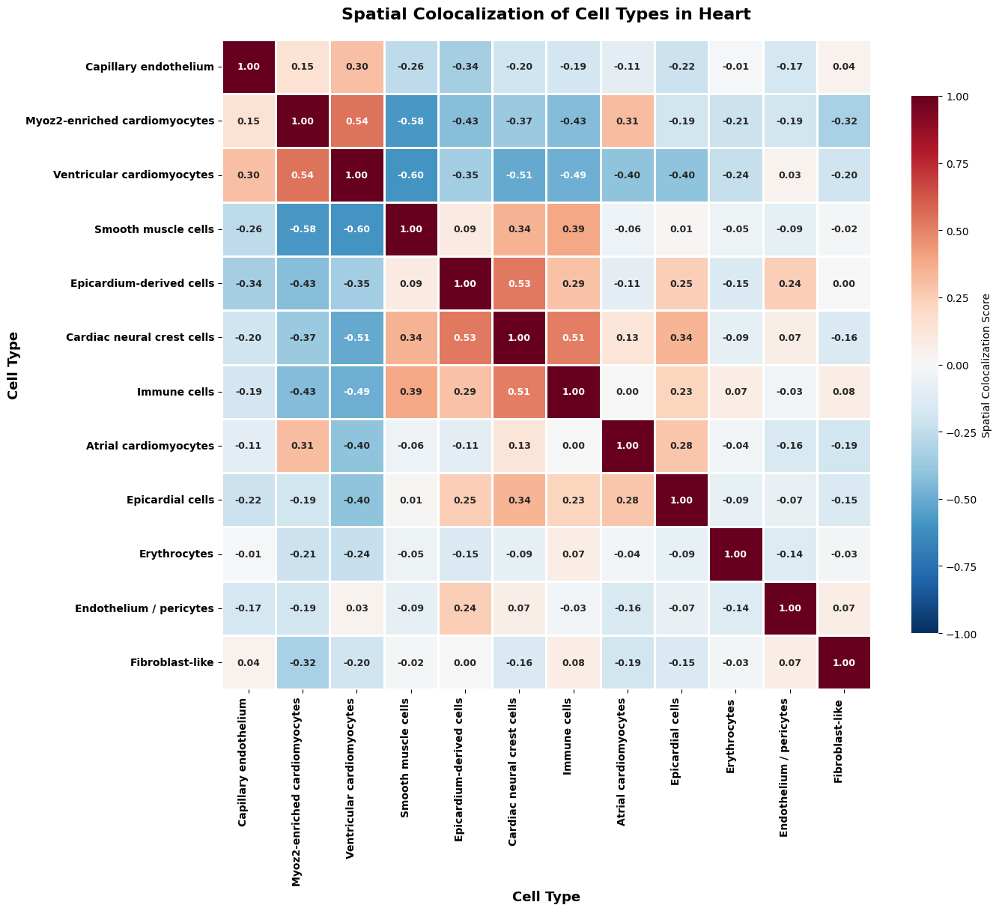

: 

In [32]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import pearsonr

# ===== 第一步：提取细胞类型数据 =====
adata = result[0]

cell_type_columns = [
    'Capillary endothelium',
    'Myoz2-enriched cardiomyocytes',
    'Ventricular cardiomyocytes',
    'Smooth muscle cells ',
    'Epicardium-derived cells',
    'Cardiac neural crest cells ',
    'Immune cells',
    'Atrial cardiomyocytes',
    'Epicardial cells',
    'Erythrocytes',
    'Endothelium / pericytes ',
    'Fibroblast-like '
]

# 提取细胞类型数据
cell_type_data = adata.obs[cell_type_columns].values

# ===== 第二步：计算共定位矩阵 =====
n_types = len(cell_type_columns)
colocalization_matrix = np.zeros((n_types, n_types))

for i in range(n_types):
    for j in range(n_types):
        if i == j:
            colocalization_matrix[i, j] = 1.0
        else:
            # 处理零方差的情况
            if cell_type_data[:, i].std() > 0 and cell_type_data[:, j].std() > 0:
                corr, _ = pearsonr(cell_type_data[:, i], cell_type_data[:, j])
                colocalization_matrix[i, j] = corr
            else:
                colocalization_matrix[i, j] = 0

# 清理列名
clean_names = [ct.strip() for ct in cell_type_columns]

# 创建DataFrame
colocalization_df = pd.DataFrame(
    colocalization_matrix,
    index=clean_names,
    columns=clean_names
)

# ===== 第三步：绘制简洁热图（无树状图） =====
plt.figure(figsize=(14, 12))

sns.heatmap(
    colocalization_df,
    cmap='RdBu_r',
    center=0,
    vmin=-1,
    vmax=1,
    annot=True,          # 显示数值
    fmt='.2f',           # 格式化为两位小数
    linewidths=1,        # 网格线宽度
    linecolor='white',   # 网格线颜色
    square=True,         # 正方形格子
    cbar_kws={
        'label': 'Spatial Colocalization Score',
        'shrink': 0.8
    },
    annot_kws={
        'size': 9,
        'weight': 'bold'
    }
)

# ===== 第四步：美化图表 =====
plt.xlabel('Cell Type', fontsize=13, fontweight='bold')
plt.ylabel('Cell Type', fontsize=13, fontweight='bold')
plt.title('Spatial Colocalization of Cell Types in Heart', 
          fontsize=16, fontweight='bold', pad=20)

# 旋转x轴标签
plt.xticks(rotation=90, ha='right', fontsize=10,fontweight='bold')
plt.yticks(rotation=0, fontsize=10,fontweight='bold')

plt.tight_layout()


# ===== 可选：保存图片 =====
plt.savefig('cell_type_colocalization_simple.png', dpi=600, bbox_inches='tight')
print("图片已保存为: cell_type_colocalization_simple.png")
plt.show()


### 插片

In [ ]:
from SINTER3D.Build_3D import generate_virtual_slice_from_adata

target_z = [2,3]
#['0.0', '3.5', '5.0', '5.5', '7.6', '9.0', '10.0', '11.0', '13.0', '14.1', '16.1', '18.0', '19.1', '20.0', '20.5', '21.0', '21.5', '22.5', '23.0', '23.5', '24.5', '25.0', '26.0', '26.5', '27.7', '29.1', '30.6', '31.6', '32.6', '33.1', '33.6', '34.1', '35.1', '37.0', '39.0']
#0 0.6 1.025 1.825 2.5 2.65 2.675 3.45
virtual_slices = generate_virtual_slice_from_adata(
    adata_st, target_z, boundary_ratio=0.7, lambda_max=1.0,spatial_name = '3D_coor'
)

adata_virtual = ad.AnnData(X=np.zeros((virtual_slices.shape[0], adata_st.shape[1])))  # 占位矩阵
adata_virtual.var_names = adata_st.var_names.copy()
adata_virtual.obsm["3D_coor"] = virtual_slices
adata_virtual.obsm['spatial'] = adata_virtual.obsm['3D_coor'][:,0:2]
adata_virtual.obs['slice'] = adata_virtual.obsm['3D_coor'][:,-1]


### 基因表达

In [5]:
adata_pred = model.inference_latent(model.adata_st,decode=True)

adata_pred

AnnData object with n_obs × n_vars = 1480 × 3828
    obs: 'nGene', 'nUMI', 'Sample', 'weeks', 'ChipBatch', 'ChipNr', 'Experiment_date', 'Experiment_procedure', 'Sequencing_date', 'Raw_reads', 'new_x', 'new_y', 'percent.mito', 'res.0.8', 'selected', 'array_row', 'array_col', 'slice', 'batch', 'library_size'
    uns: 'log1p'
    obsm: '3D_coor', 'count', 'graph', 'loc_use', 'spatial', 'spatial_aligned', 'X_pred', 'latent'

In [34]:
# 1. 导入库
import pandas as pd
import scanpy as sc

x_pred_df = pd.DataFrame(
    data=adata_pred.obsm['X_pred'],
    index=adata_pred.obs.index,  # 行 = obs.index
    columns=adata_pred.var.index  # 列 = var.index
)

x_pred_df.to_csv("Human_heart_X_pred.csv", index=True)  # index=True保留行索引


In [32]:
import plotly.graph_objects as go

def plot_gene_3d_interactive(adata, gene, key='X_origin', coord_key='3D_coor', cmap='Viridis', size=5,
                             width=800, height=600):
    coords = adata.obsm[coord_key]
    gi = adata.var.index.get_loc(gene)
    expr = adata.obsm[key][:, gi]

    fig = go.Figure(data=[go.Scatter3d(
        x=coords[:, 0],
        y=coords[:, 1],
        z=coords[:, 2],
        mode='markers',
        marker=dict(
            size=size,
            color=expr,
            colorscale=cmap,
            showscale=True,
            colorbar=dict(title='Expression')

        ),
        text=[f"Spot {i}" for i in range(len(expr))],
        hovertemplate="X: %{x}<br>Y: %{y}<br>Z: %{z}<br>Expr: %{marker.color:.2f}<extra></extra>"
    )])

    fig.update_layout(
        title=f"{gene} 3D expression ({key})",
        scene=dict(
            xaxis_title='X',
            yaxis_title='Y',
            zaxis_title='Z'
        ),
        width=width,
        height=height
    )
    fig.show()


In [33]:
plot_gene_3d_interactive(adata_pred, 'IGF2', key='X_pred',width=1200, height=800,cmap='Viridis')  # 真实


['Atrial cardiomyocytes', 'Capillary endothelium', 'Cardiac neural crest cells ', 'Endothelium / pericytes ', 'Epicardial cells', 'Epicardium-derived cells', 'Erythrocytes', 'Fibroblast-like ', 'Immune cells', 'Myoz2-enriched cardiomyocytes', 'Smooth muscle cells ', 'Ventricular cardiomyocytes']


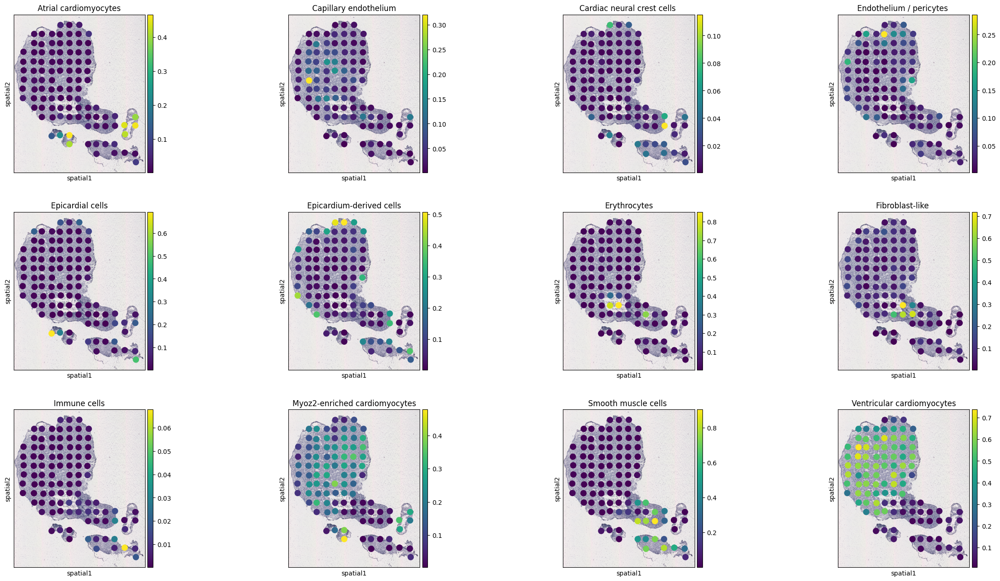

['Atrial cardiomyocytes', 'Capillary endothelium', 'Cardiac neural crest cells ', 'Endothelium / pericytes ', 'Epicardial cells', 'Epicardium-derived cells', 'Erythrocytes', 'Fibroblast-like ', 'Immune cells', 'Myoz2-enriched cardiomyocytes', 'Smooth muscle cells ', 'Ventricular cardiomyocytes']


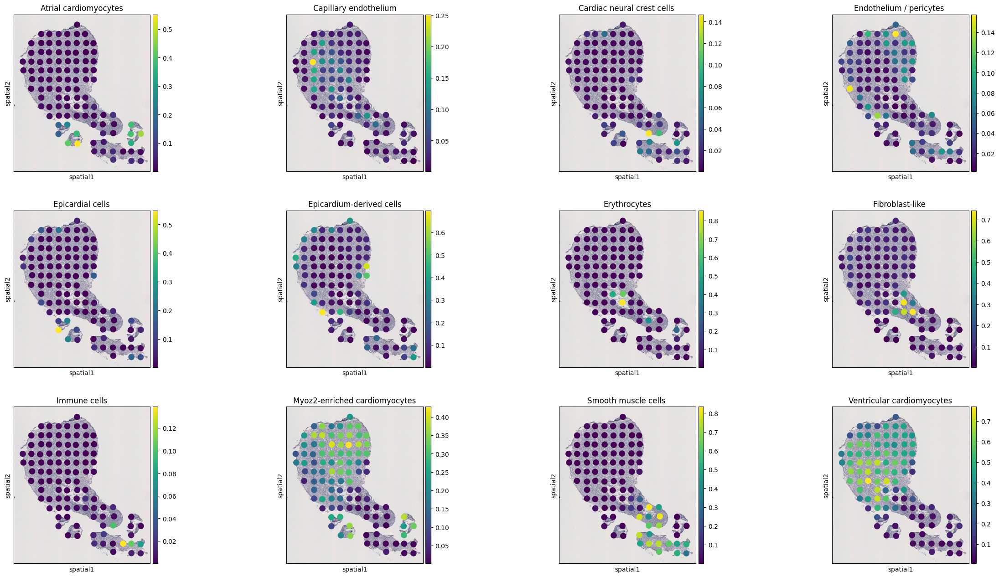

['Atrial cardiomyocytes', 'Capillary endothelium', 'Cardiac neural crest cells ', 'Endothelium / pericytes ', 'Epicardial cells', 'Epicardium-derived cells', 'Erythrocytes', 'Fibroblast-like ', 'Immune cells', 'Myoz2-enriched cardiomyocytes', 'Smooth muscle cells ', 'Ventricular cardiomyocytes']


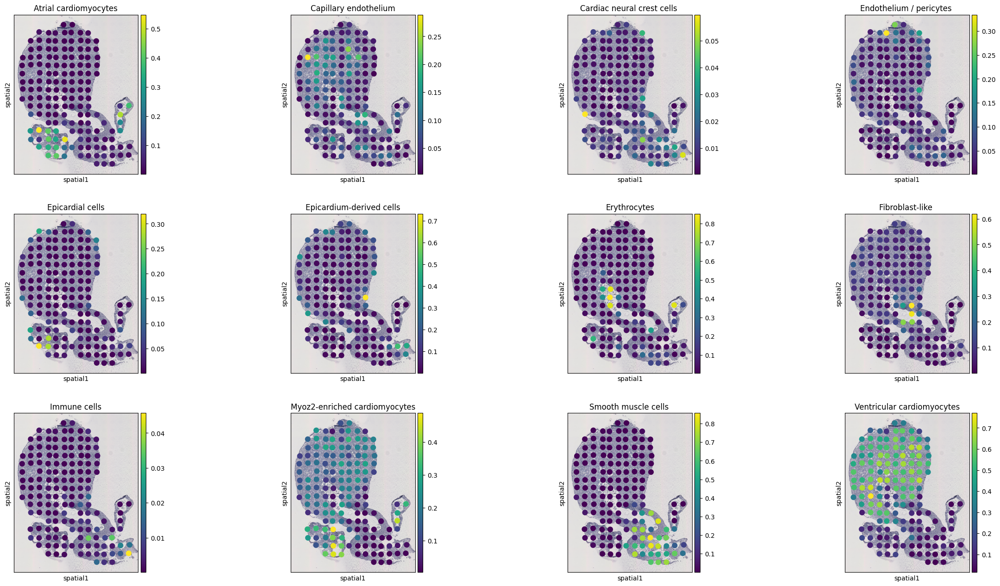

['Atrial cardiomyocytes', 'Capillary endothelium', 'Cardiac neural crest cells ', 'Endothelium / pericytes ', 'Epicardial cells', 'Epicardium-derived cells', 'Erythrocytes', 'Fibroblast-like ', 'Immune cells', 'Myoz2-enriched cardiomyocytes', 'Smooth muscle cells ', 'Ventricular cardiomyocytes']


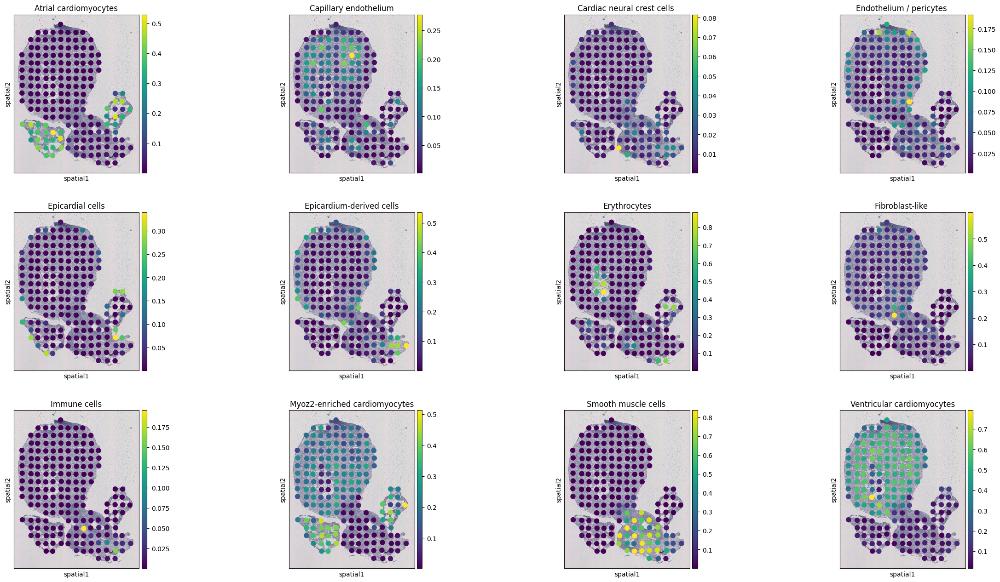

['Atrial cardiomyocytes', 'Capillary endothelium', 'Cardiac neural crest cells ', 'Endothelium / pericytes ', 'Epicardial cells', 'Epicardium-derived cells', 'Erythrocytes', 'Fibroblast-like ', 'Immune cells', 'Myoz2-enriched cardiomyocytes', 'Smooth muscle cells ', 'Ventricular cardiomyocytes']


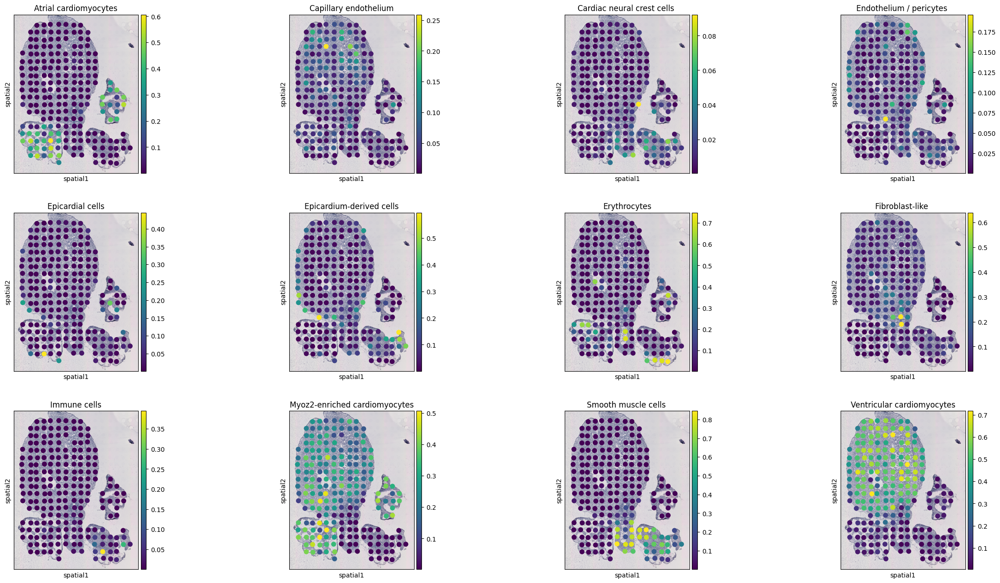

['Atrial cardiomyocytes', 'Capillary endothelium', 'Cardiac neural crest cells ', 'Endothelium / pericytes ', 'Epicardial cells', 'Epicardium-derived cells', 'Erythrocytes', 'Fibroblast-like ', 'Immune cells', 'Myoz2-enriched cardiomyocytes', 'Smooth muscle cells ', 'Ventricular cardiomyocytes']


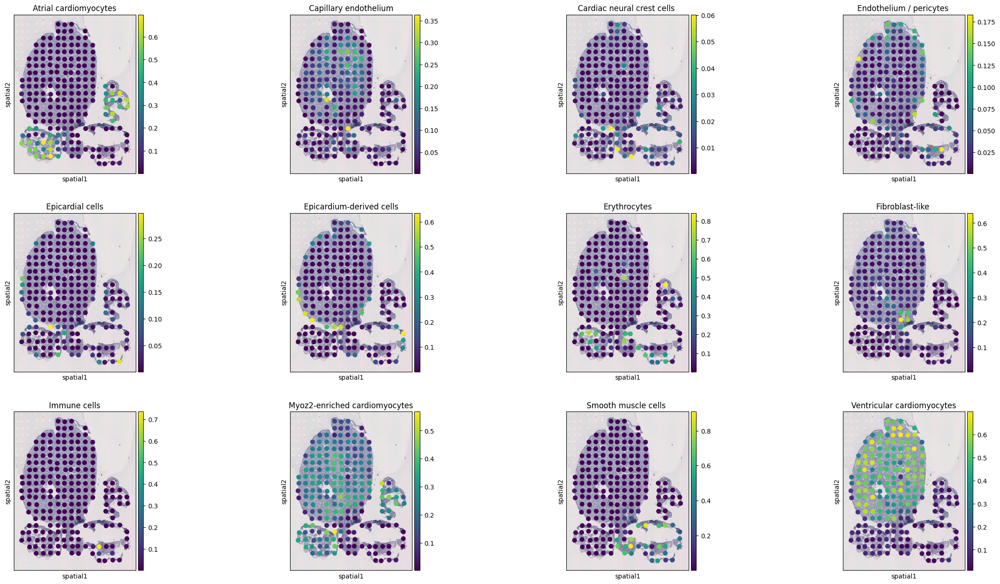

['Atrial cardiomyocytes', 'Capillary endothelium', 'Cardiac neural crest cells ', 'Endothelium / pericytes ', 'Epicardial cells', 'Epicardium-derived cells', 'Erythrocytes', 'Fibroblast-like ', 'Immune cells', 'Myoz2-enriched cardiomyocytes', 'Smooth muscle cells ', 'Ventricular cardiomyocytes']


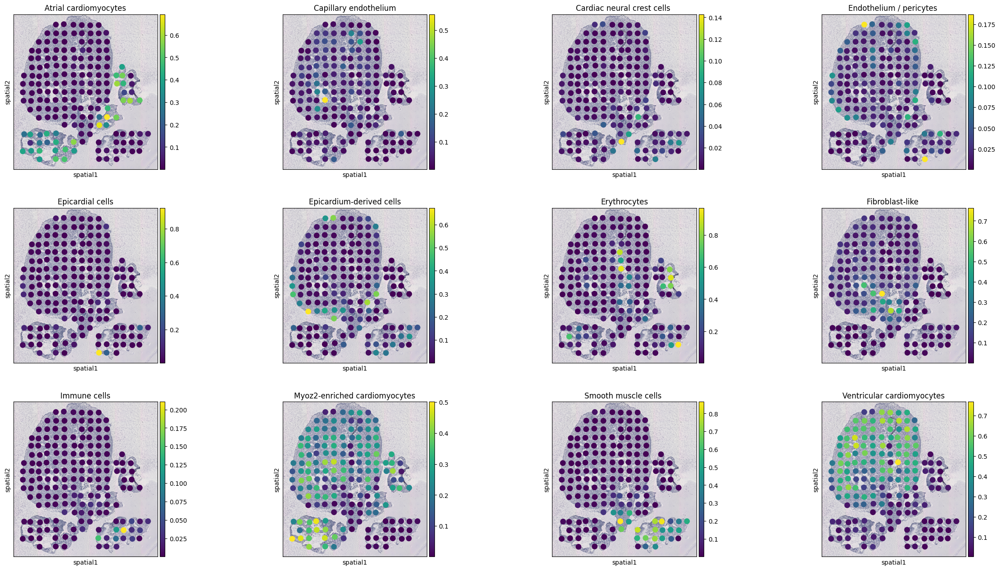

['Atrial cardiomyocytes', 'Capillary endothelium', 'Cardiac neural crest cells ', 'Endothelium / pericytes ', 'Epicardial cells', 'Epicardium-derived cells', 'Erythrocytes', 'Fibroblast-like ', 'Immune cells', 'Myoz2-enriched cardiomyocytes', 'Smooth muscle cells ', 'Ventricular cardiomyocytes']


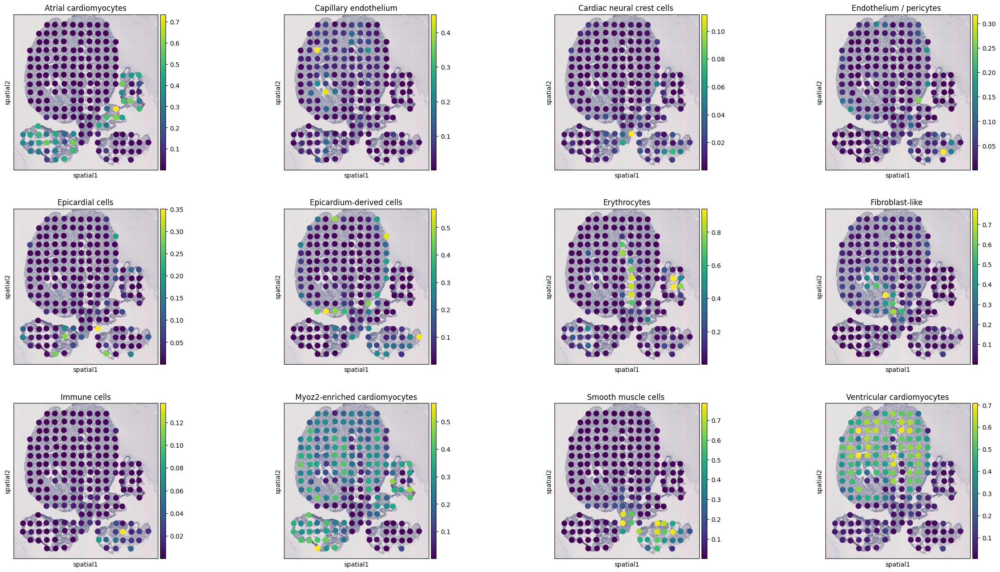

['Atrial cardiomyocytes', 'Capillary endothelium', 'Cardiac neural crest cells ', 'Endothelium / pericytes ', 'Epicardial cells', 'Epicardium-derived cells', 'Erythrocytes', 'Fibroblast-like ', 'Immune cells', 'Myoz2-enriched cardiomyocytes', 'Smooth muscle cells ', 'Ventricular cardiomyocytes']


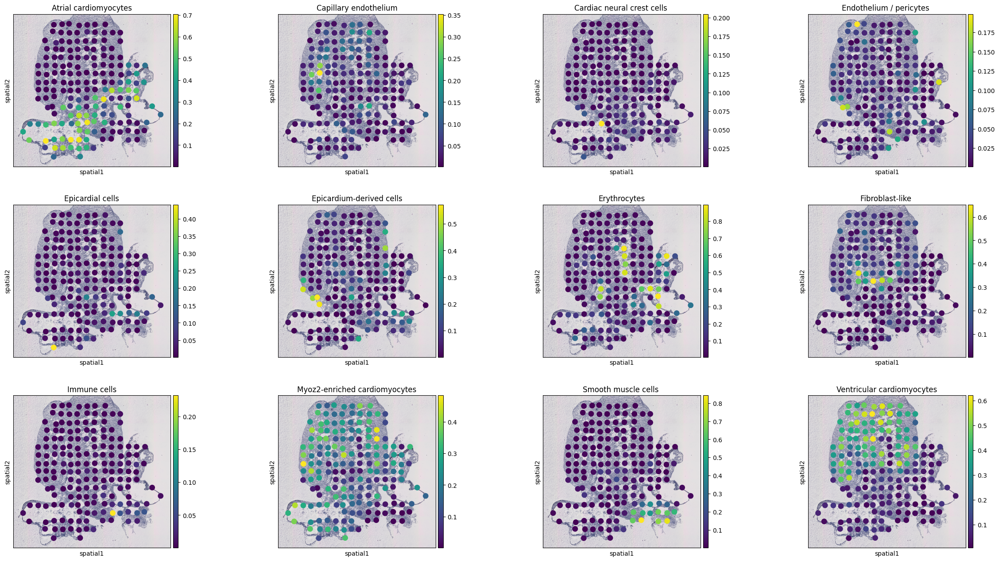

In [38]:
save_path = "./results_DLPFC/"
result = model.eval(adata_st_list, save=None, output_path=save_path)

for i, adata_st_i in enumerate(result):
    #print("Slice %d cell-type deconvolution result:" % slice_idx[i])
    
    print(list(adata_basis.obs.index))
    sc.pl.spatial(adata_st_i, spot_size=150,
                  color=list(adata_basis.obs.index), size=1.)

